In [1]:
from filters import *

images/baboon.png
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
images/MRI.png
(725, 728)
(725, 728)
(725, 728)
(725, 728)
images/peppers.png
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
images/tulips.png
(512, 768, 3)
(512, 768, 3)
(512, 768, 3)
(512, 768, 3)


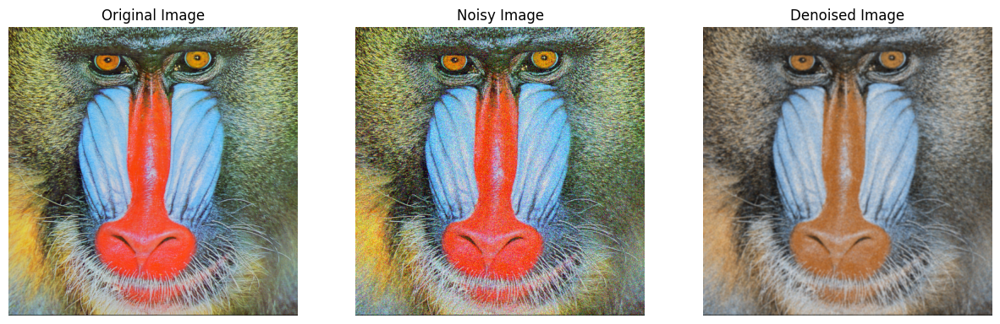

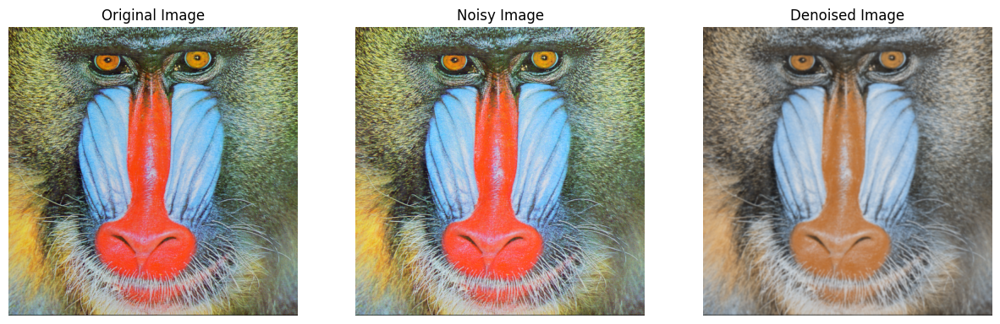

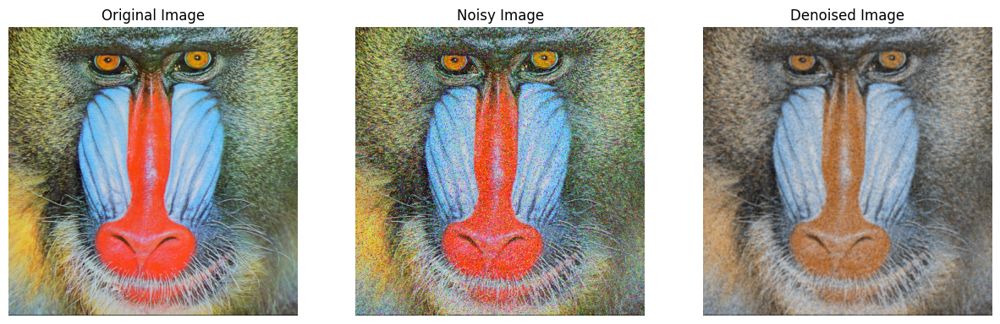

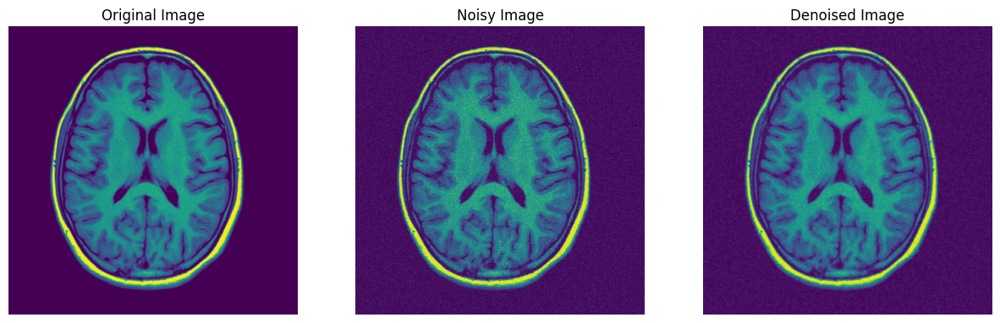

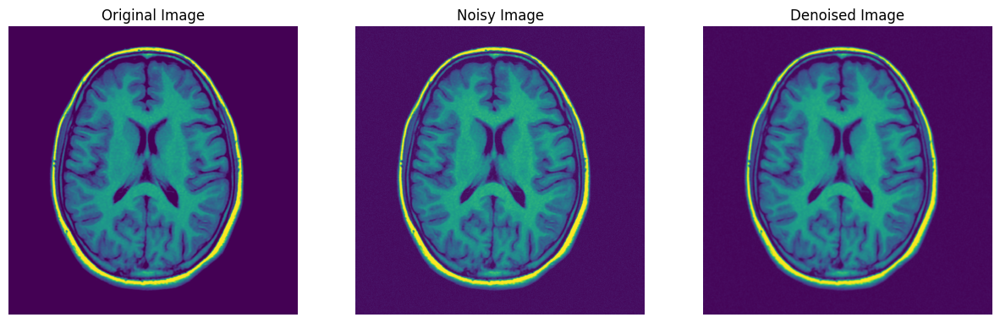

...

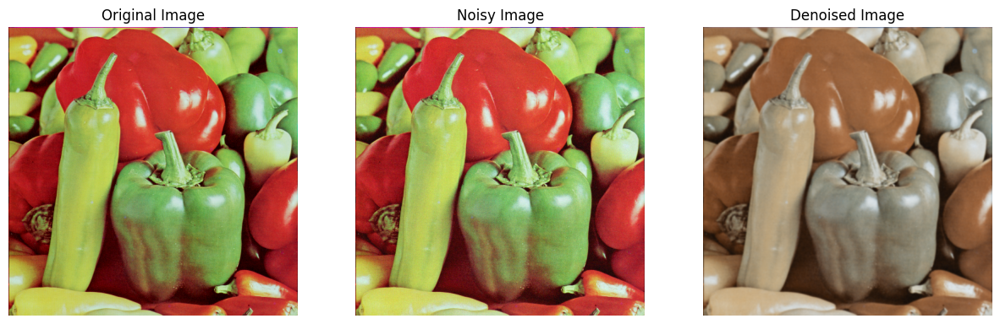

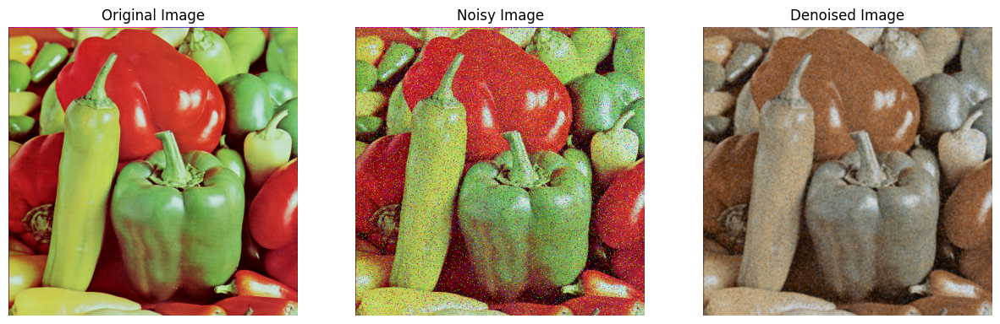

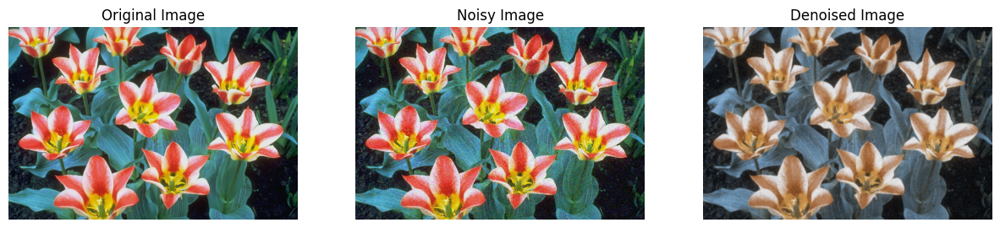

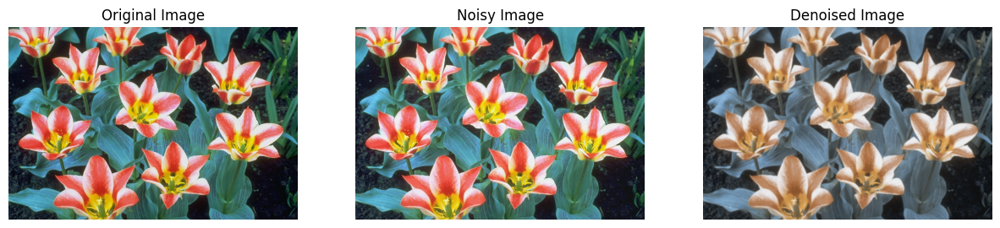

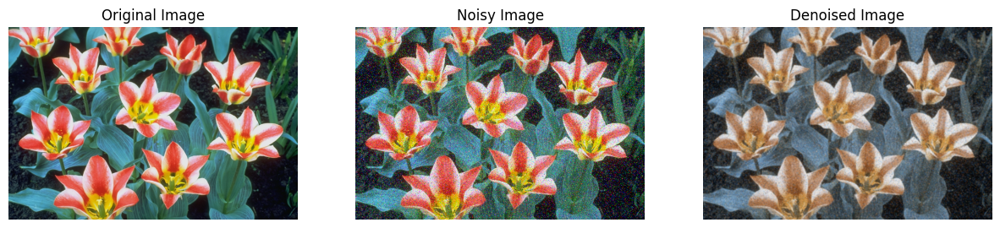

In [ ]:
#test cases for the gaussian_denoise function with available images, we first need to add noise to them first
#then we will apply the gaussian_denoise function to them and compare the results with the original images
test_files = [
    #"walkbridge.tiff",
    "baboon.png",
    "MRI.png",
    "peppers.png",
    "tulips.png"
]

#manually add noise to the image
for file in test_files:
    add_gaussian_noise(file, "images/", "images/noise_test/")
    add_rician_noise(file, "images/", "images/noise_test/")
    add_salt_and_pepper_noise(file, "images/", "images/noise_test/")

noise_types = [
    "gnoise",
    "rnoise",
    "spnoise"
]

#apply the gaussian denoise function to the noisy images
for file in test_files:
    for noise in noise_types:
        base_filename = file.rsplit('.', 1)[0]
        file_ext = file.rsplit('.', 1)[1]
        noise_file = base_filename + "_" + noise + "." + file_ext
        gaussian_denoise("images/noise_test/"+noise_file, 
                         "images/denoise_test/"+noise_file)
        
#display every test image next to its noise and denoised versions
for file in test_files:
    for noise in noise_types:
        base_filename = file.rsplit('.', 1)[0]
        file_ext = file.rsplit('.', 1)[1]
        noise_file = base_filename + "_" + noise + "." + file_ext
        denoised_file = base_filename + "_" + noise + "." + file_ext

        display_images("images/noise_test/"+noise_file, "images/denoise_test/"+denoised_file, "images/"+file)

In [11]:
import imageio.v3 as iio
import numpy as np

test_tif = "images/walkbridge.tiff"

# Read the TIFF file
image = iio.imread(test_tif)

# Check shape
print("Original shape:", image.shape)

# If it's (H, W, 2), extract only the first channel
image = image[:, :, 0]

# Convert to uint8 (if needed)
image = np.clip(image, 0, 255).astype(np.uint8)

# Save as a new TIFF
iio.imwrite("test_fixed.tiff", image)

print("Fixed image saved as test_fixed.tiff")


Original shape: (512, 512, 2)
Fixed image saved as test_fixed.tiff


In [8]:
import imageio.v3 as iio
test_bmp = "images/lena.bmp"
image = iio.imread(test_bmp)
iio.imwrite("test.bmp", image)